In [199]:
import sys
import pickle
from os.path import join
sys.path.append("../../src")

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgba
from matplotlib.collections import PolyCollection

from scipy.stats import spearmanr

import video_analyses
from data_processing import *
from plot_utils import *
import mne

import warnings
warnings.filterwarnings("ignore")


# FOR GUIDELINES
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [200]:
participants = ['00','01','02','04','05','06','07','08','09','10','11','12','13','14','15', '16', 
                '17', '20', '23', '24', '26', '28', '30','31','32','33','34']

unresponsive_IDs = ['02', '06', '10', '11', '15', '16', '20', '26', '30', '32', '34']
relaxed_IDs = ['00', '01', '04', '05', '07', '08', '09', '12', '13', '14', '17', '23', '24', '28', '31', '33']

In [201]:
regions = {
    'frontal': ['Fp2', 'AF4', 'AF8', 'F8', 'F6', 'F4', 'F2', 'Fp1', 'AF3', 'AF7', 'F7', 'F5', 'F3', 'F1'],
    'temporal': ['FT8', 'FT10', 'T8', 'TP8', 'TP10', 'FT7', 'FT9', 'T7', 'TP7', 'TP9'],
    'central': ['FC2', 'FC4', 'FC6', 'C6', 'C4', 'C2', 'FC1', 'FC3', 'FC5', 'C5', 'C3', 'C1'],
    'parietal': ['CP2', 'CP4', 'CP6', 'P6', 'P4', 'P2', 'CP1', 'CP3', 'CP5', 'P5', 'P3', 'P1'],
    'occipital': ['P8', 'PO8', 'PO4', 'O2', 'P7', 'PO7', 'PO3', 'O1'],
    'midline': ['AFz', 'Fz', 'Cz', 'CPz', 'Pz', 'POz', 'Oz', 'Iz']
}

--------

# SUPPLEMENTARY MATERIALS

## Supplemental Figure. 1. STAI-Y1 scores of each group.

In [202]:
STAIY = pd.read_csv(join('..', 'Data', 'STAI-Y1-SCORES.csv'), sep=';')
STAIY['order'] = STAIY['order'].astype(str)
STAIY.head()

,Participant,score,order,group,baseline
0,0,35,0,0,35
1,1,31,0,0,22
2,2,34,0,1,35
3,4,28,0,0,22
4,5,37,0,0,39


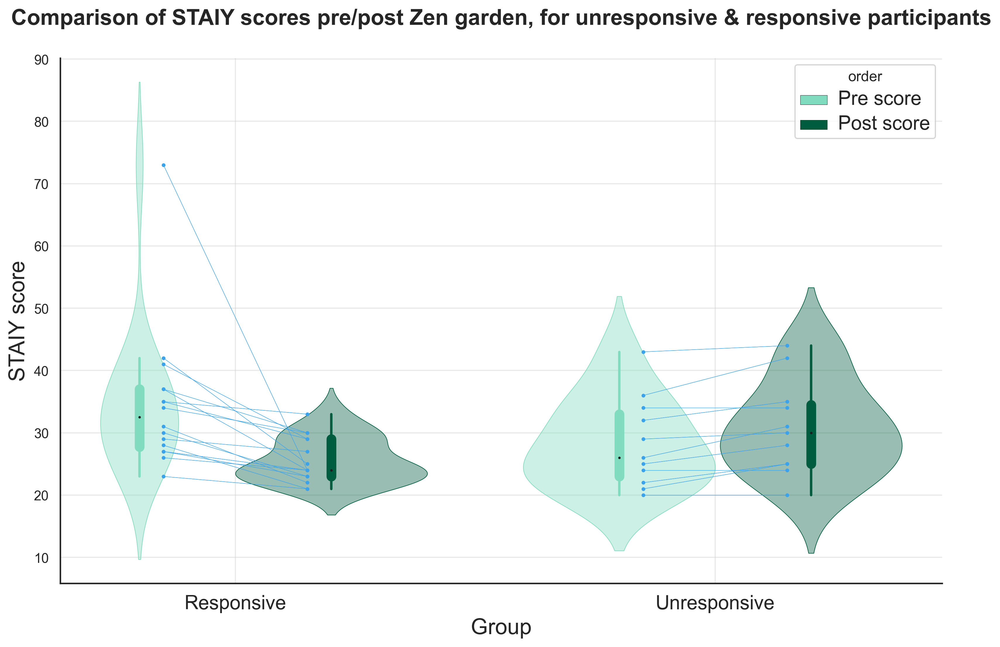

In [203]:
violin_plots_staiy(STAIY)

## Supplemental Figure. 2. Baseline STAI-Y1 scores of each group.

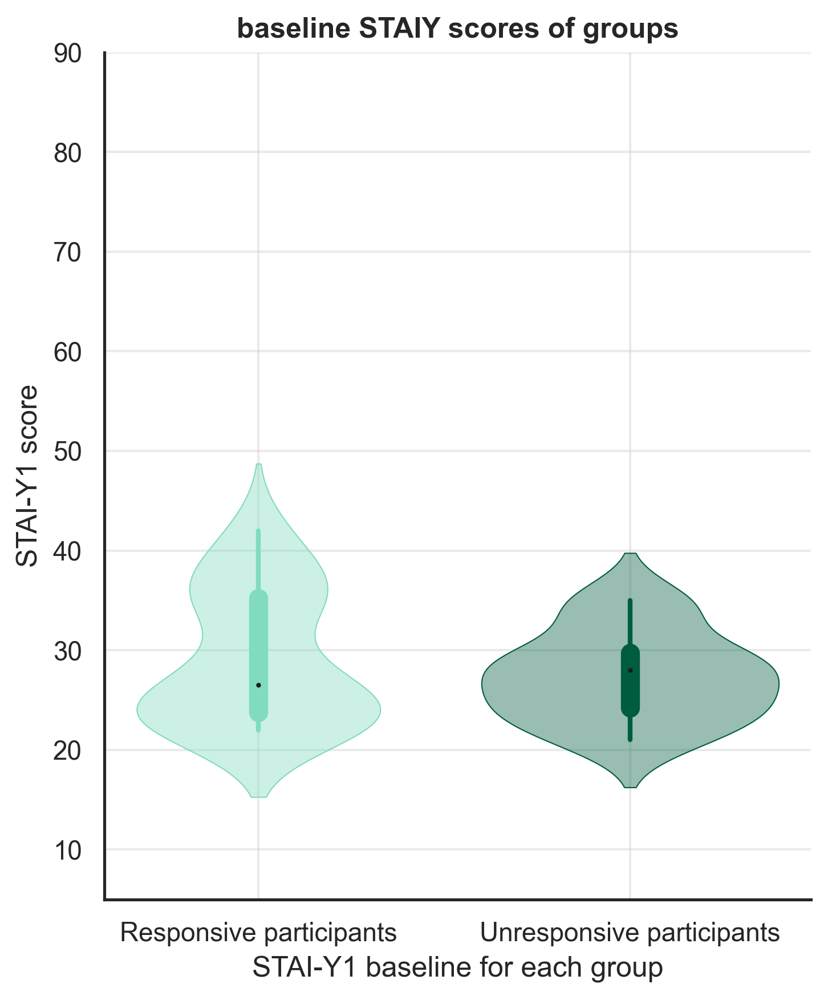

In [204]:
plot_baseline_staiy(STAIY, subtitle=None)

## Supplemental Figure 4. ECG LF differences across conditions in all participants and each subgroup.

In [205]:
LF_normalized_zg = pd.read_csv(join('..', 'data', 'LF_normalized_zg.csv'))
LF_normalized_ctl = pd.read_csv(join('..', 'data', 'LF_normalized_ctl.csv'))
melted_data_metrics = pd.read_csv(join('..', 'data', 'df_metrics_melted.csv'))

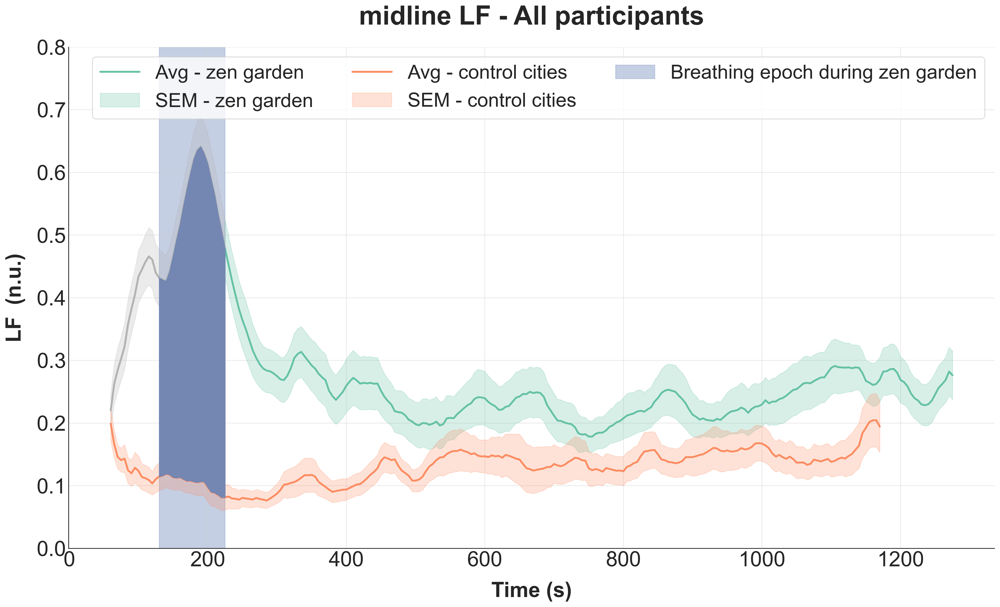

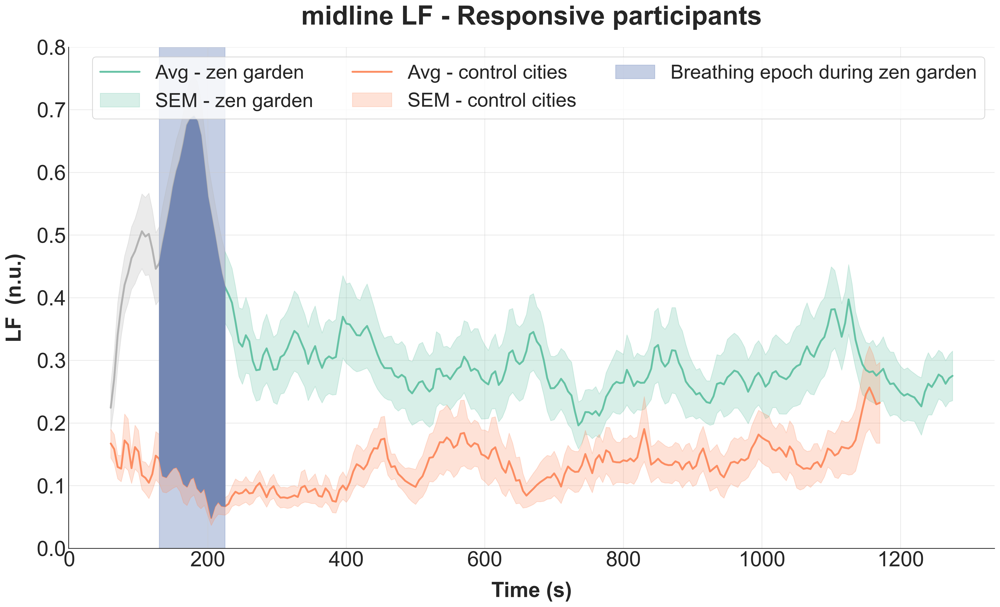

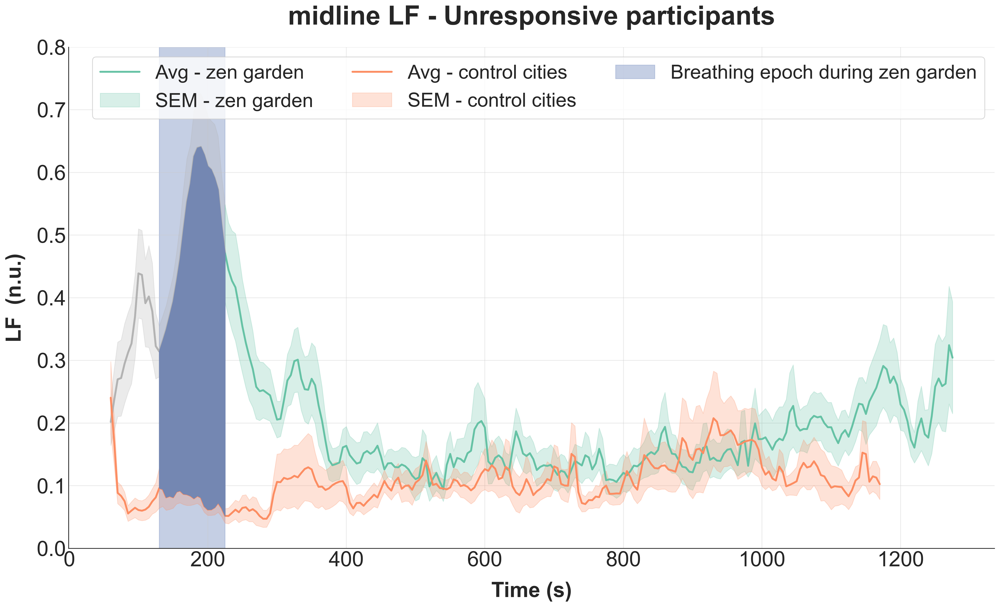

In [206]:
smoothness = 2
subgroups = [unresponsive_IDs, relaxed_IDs]
LF_unresponsive_zg, LF_unresponsive_ctl, LF_relaxed_zg, LF_relaxed_ctl = divide_ECG_into_groups(globals()[f"{'LF'}_3D_normalized"], globals()[f"{'LF'}_2D_normalized"], subgroups, 'LF')

temporal_plot_comparison(LF_normalized_zg, LF_normalized_ctl, region='LF', band='', type='ECG', participants='All',highlight_epoch_start= 14, highlight_epoch_end=33, smoothness=5, leg_pos='upper right', n=27)
temporal_plot_comparison(LF_relaxed_zg, LF_relaxed_ctl, region='LF', band='', type='ECG', participants='Responsive', highlight_epoch_start=14, highlight_epoch_end=33, smoothness=smoothness, leg_pos='upper right', n=16)
temporal_plot_comparison(LF_unresponsive_zg, LF_unresponsive_ctl, region='LF', band='', type='ECG', participants='Unresponsive', highlight_epoch_start=14, highlight_epoch_end=33, smoothness=smoothness, leg_pos='upper right', n=11)

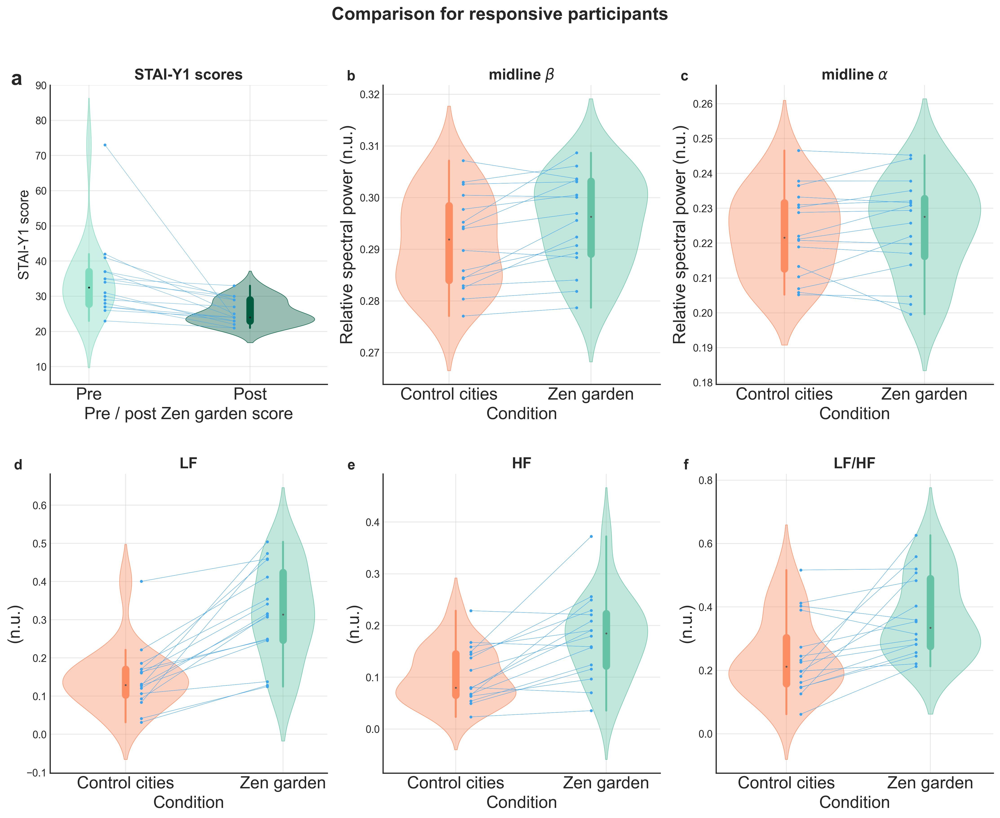

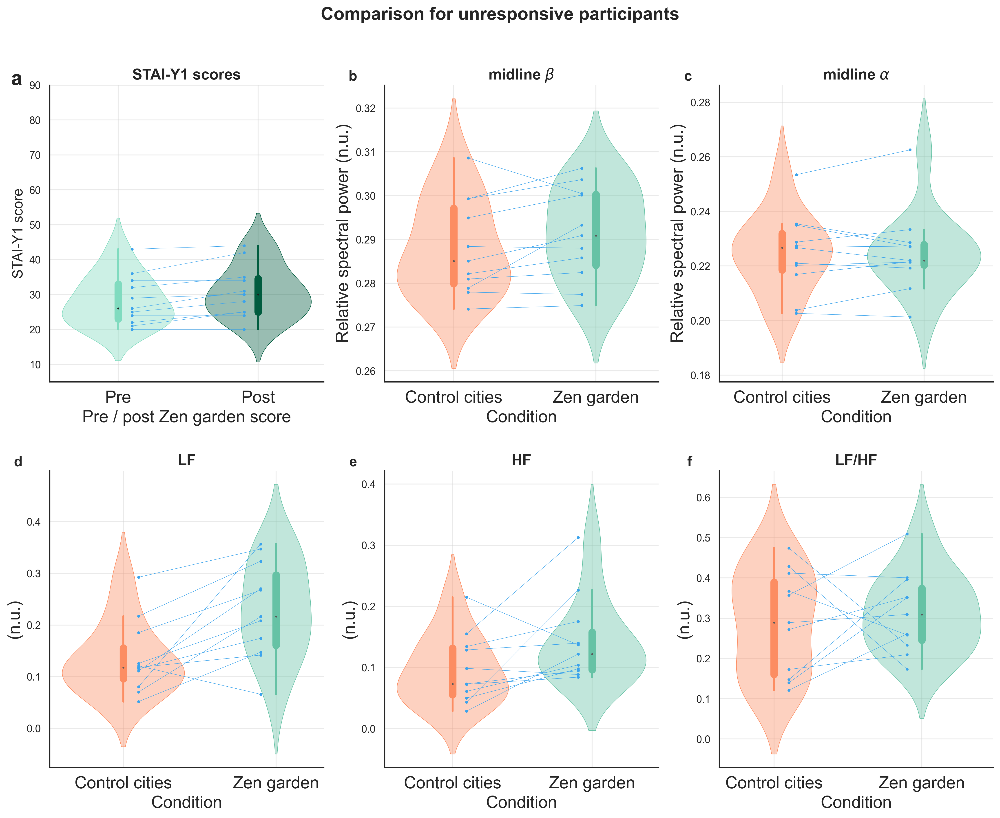

In [207]:
# LF violin plots for responsive and unresponsive participants
violin_plots_metrics_and_staiy(melted_data_metrics, STAIY, 0, 'responsive', 0)
violin_plots_metrics_and_staiy(melted_data_metrics, STAIY, 1, 'unresponsive', 0)

In [208]:
regions_beta = pd.read_csv(join('..', 'data', 'EEG_beta_regions.csv'))
melted_beta_regions_plot = process_EEG_data_violin(regions_beta, 'beta')
melted_beta_regions_plot.head()

,ID,condition,group,variable,value
0,0,0,0,frontal_beta,0.287453
1,1,0,0,frontal_beta,0.290574
2,2,0,1,frontal_beta,0.278200
3,4,0,0,frontal_beta,0.297534
4,5,0,0,frontal_beta,0.304855


# Supplemental Figure 5

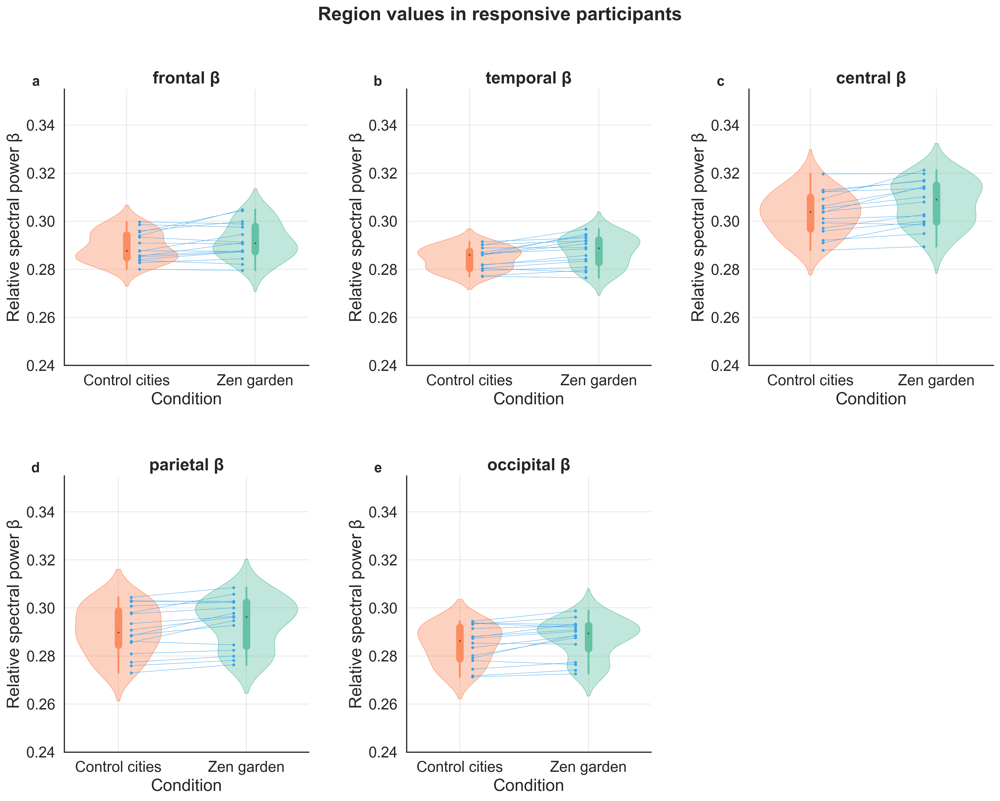

In [209]:
violin_plot_EEG_regions(melted_beta_regions_plot, 0, 'responsive','beta')

In [210]:
regions_beta_topo = process_EEG_for_topoplot(regions_beta, 'beta')
regions_beta_topo.head()

,condition,group,variable,value
0,0,0,central_beta,0.307635
1,0,0,frontal_beta,0.291805
2,0,0,midline_beta,0.295219
3,0,0,occipital_beta,0.287295
4,0,0,parietal_beta,0.293836


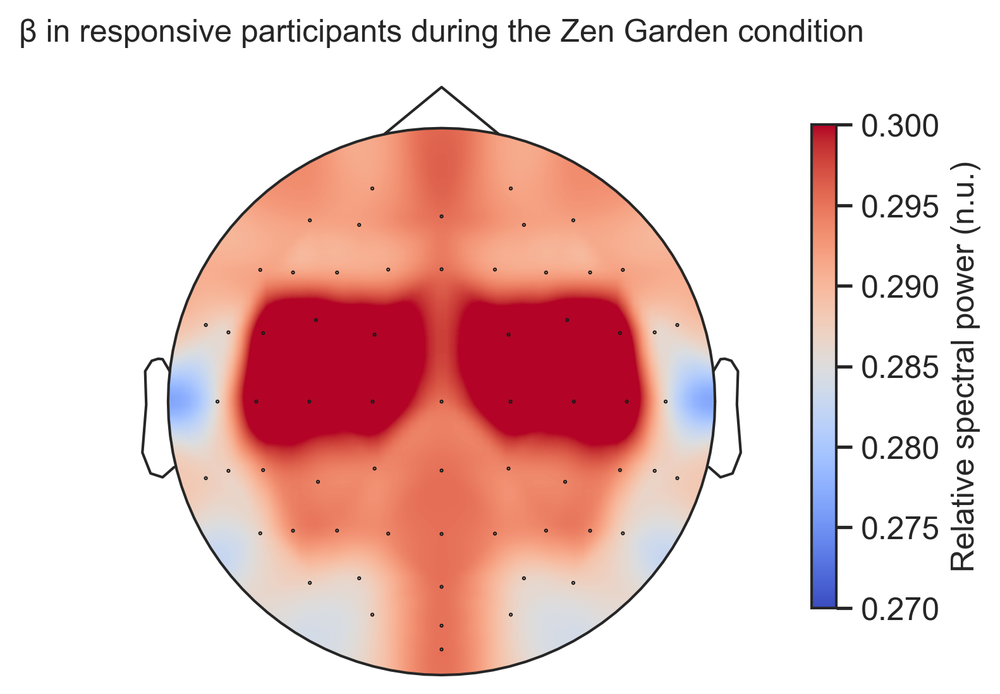

In [211]:
plot_topomap_condition(regions_beta_topo, regions, 0, 0, 'beta', vlim = (0.27,0.3), title='β in responsive participants during the Zen Garden condition')

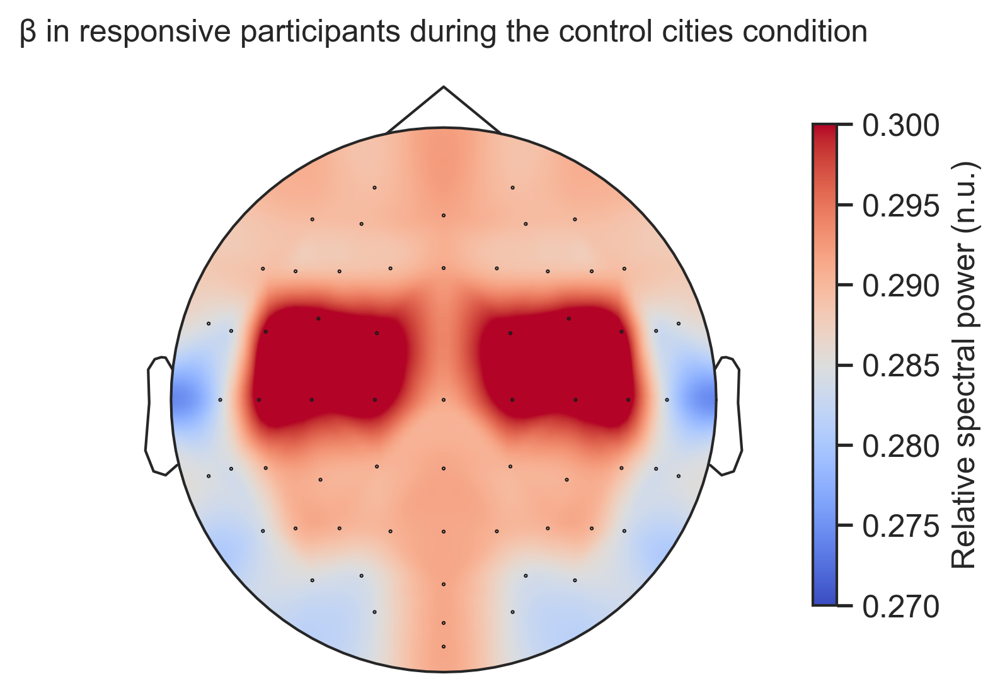

In [212]:
plot_topomap_condition(regions_beta_topo, regions, 0, 1, 'beta', vlim = (0.27,0.3), title='β in responsive participants during the control cities condition')

# Supplemental Figure 6

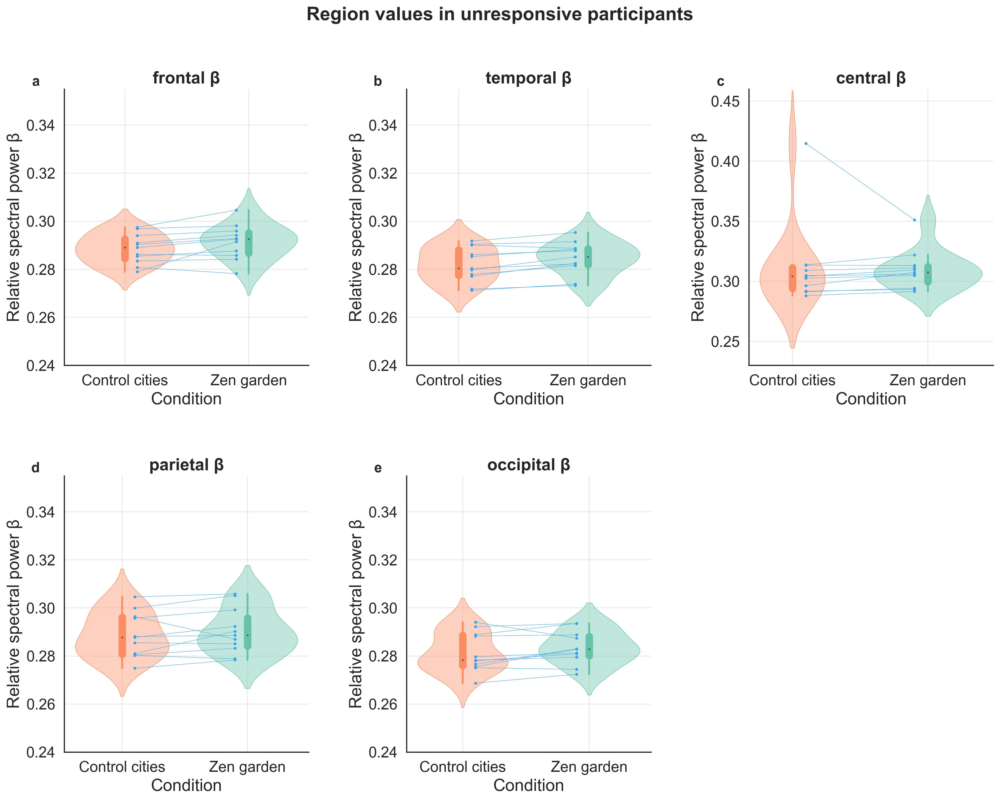

In [213]:
violin_plot_EEG_regions(melted_beta_regions_plot, 1, 'unresponsive','beta')

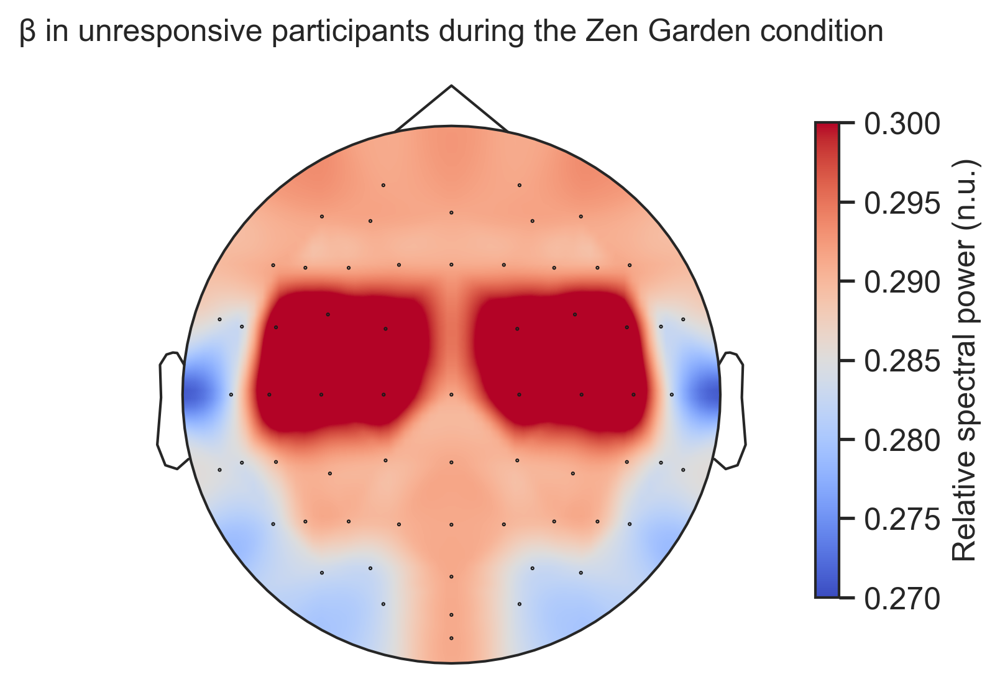

In [214]:
plot_topomap_condition(regions_beta_topo, regions, 1, 0, 'beta', vlim = (0.27,0.3), title='β in unresponsive participants during the Zen Garden condition')

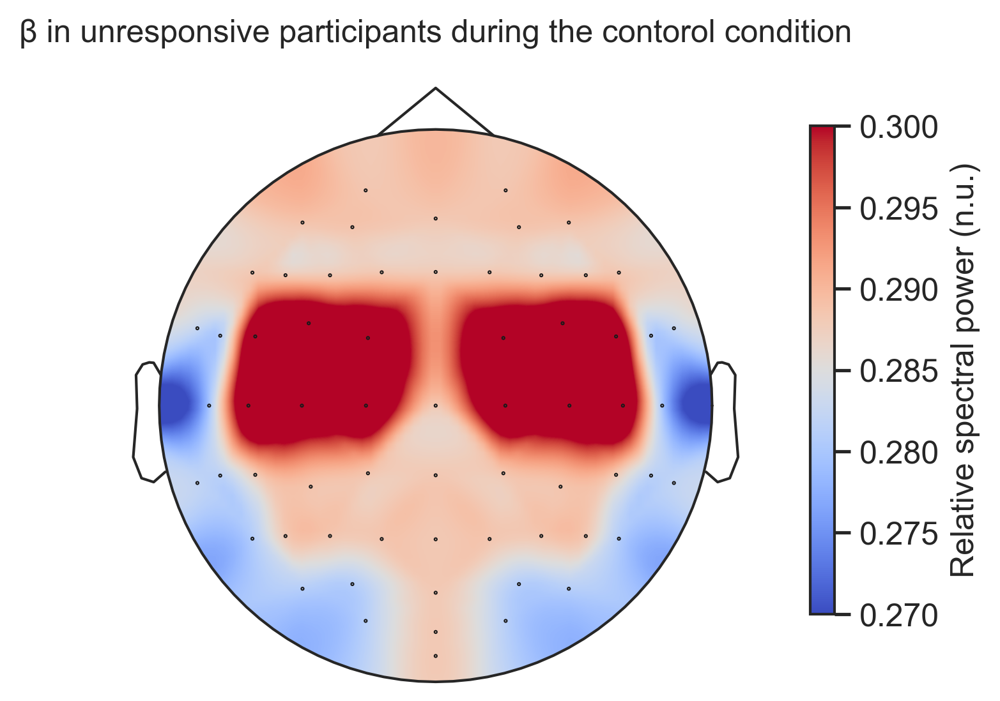

In [215]:
plot_topomap_condition(regions_beta_topo, regions, 1, 1, 'beta', vlim = (0.27,0.3), title='β in unresponsive participants during the contorol condition')

# Supplemental Figure 7

In [216]:
high_alpha_regions = pd.read_csv(join('..', 'data', 'EEG_high_alpha_regions.csv')) # preprocessed data and outlier 30 is removed based on R codes (aberrant negative EEG value in central region)
high_alpha_regions.head()

,ID,condition,group,variable,value
0,0,0,0,frontal_high_alpha,0.165073
1,1,0,0,frontal_high_alpha,0.159103
2,2,0,1,frontal_high_alpha,0.156095
3,4,0,0,frontal_high_alpha,0.158662
4,5,0,0,frontal_high_alpha,0.160568


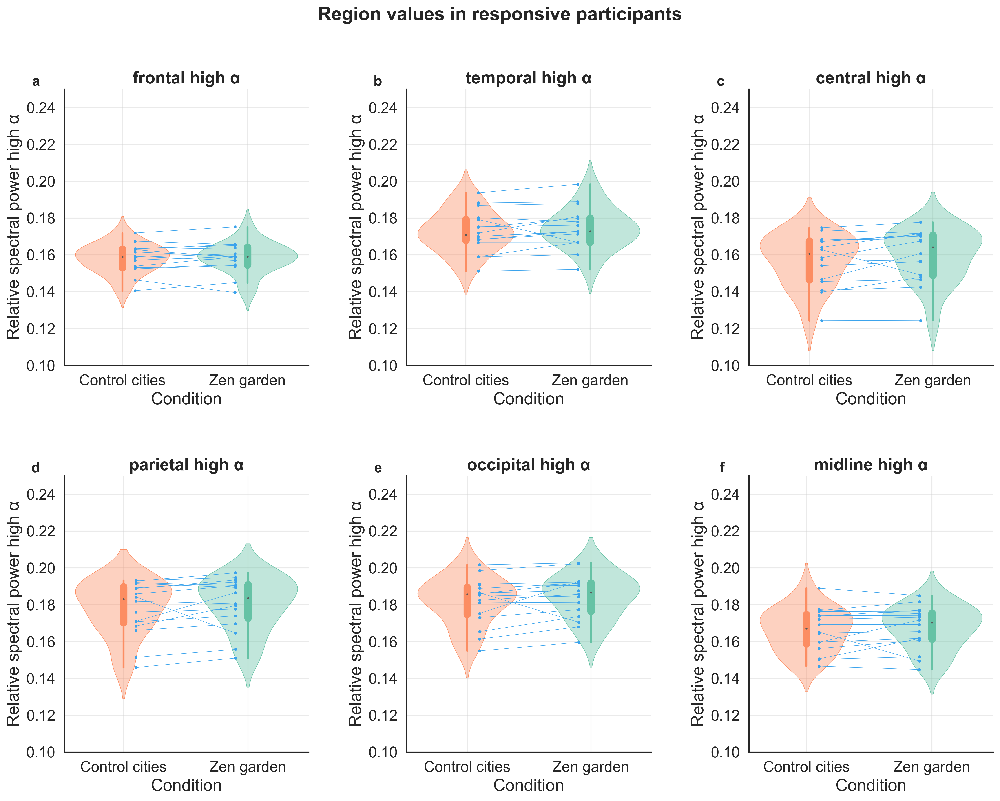

In [217]:
violin_plot_EEG_regions(high_alpha_regions, 0, 'responsive','high_alpha')

# Supplemental Figure 7, panels g,h,i

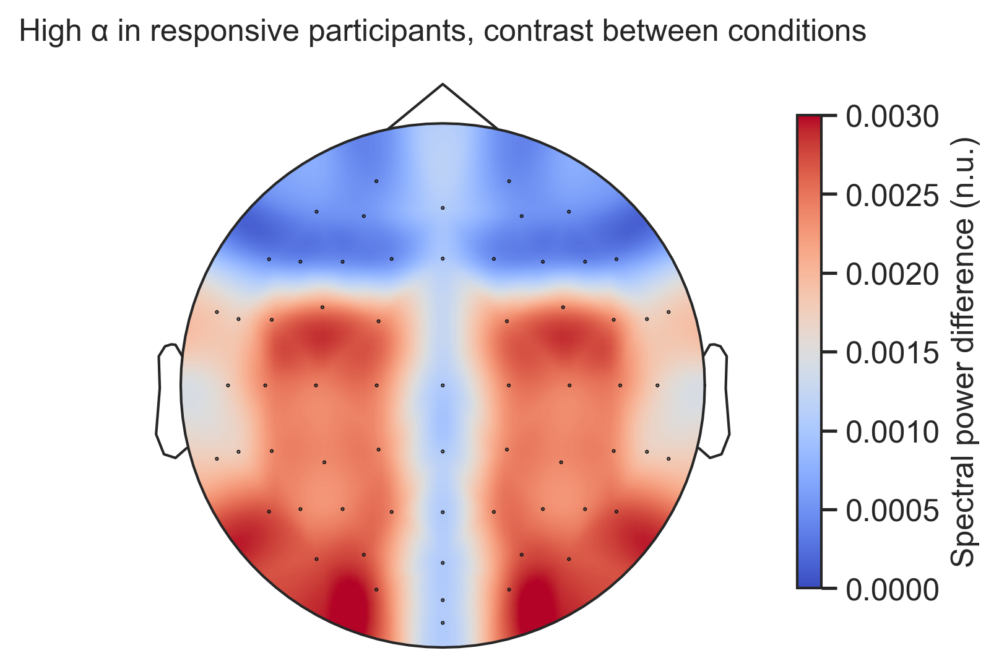

In [218]:
df_high_alpha_groups = means_by_region(high_alpha_regions, group_option='groups')
high_alpha_responsives = extract_contrast_values(df_high_alpha_groups, 0, 'high_alpha')
plot_contrast_topomap(regions, high_alpha_responsives, vlim = (0,0.003), title='High α in responsive participants, contrast between conditions')

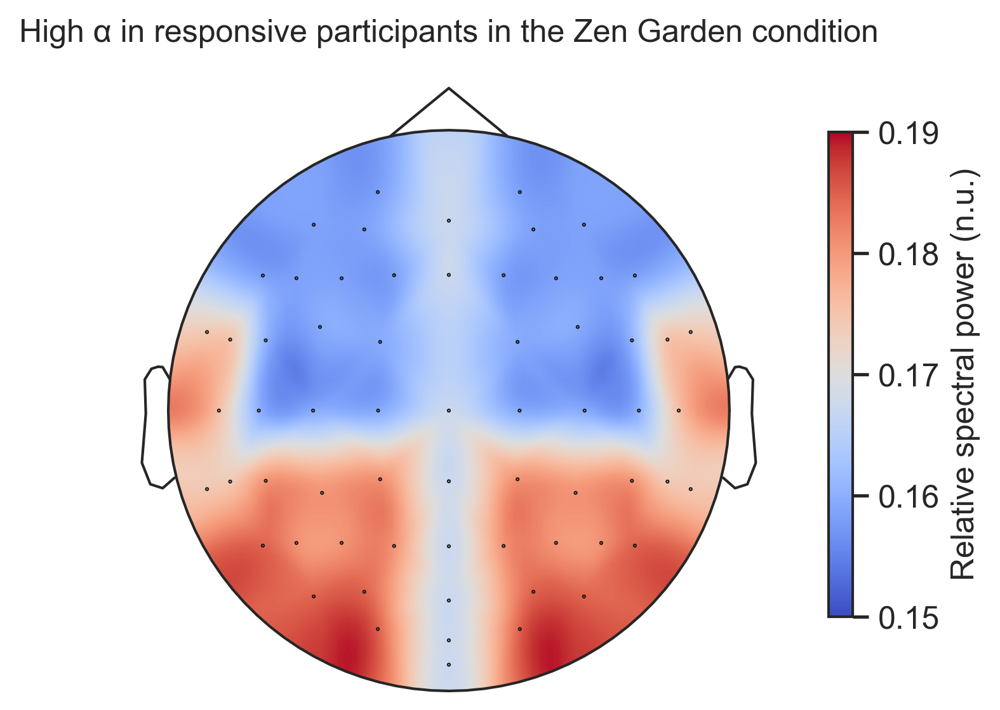

In [219]:
plot_topomap_condition(df_high_alpha_groups, regions, group=0, condition=0, bandname='high_alpha', vlim=(0.15,0.19), title='High α in responsive participants in the Zen Garden condition')

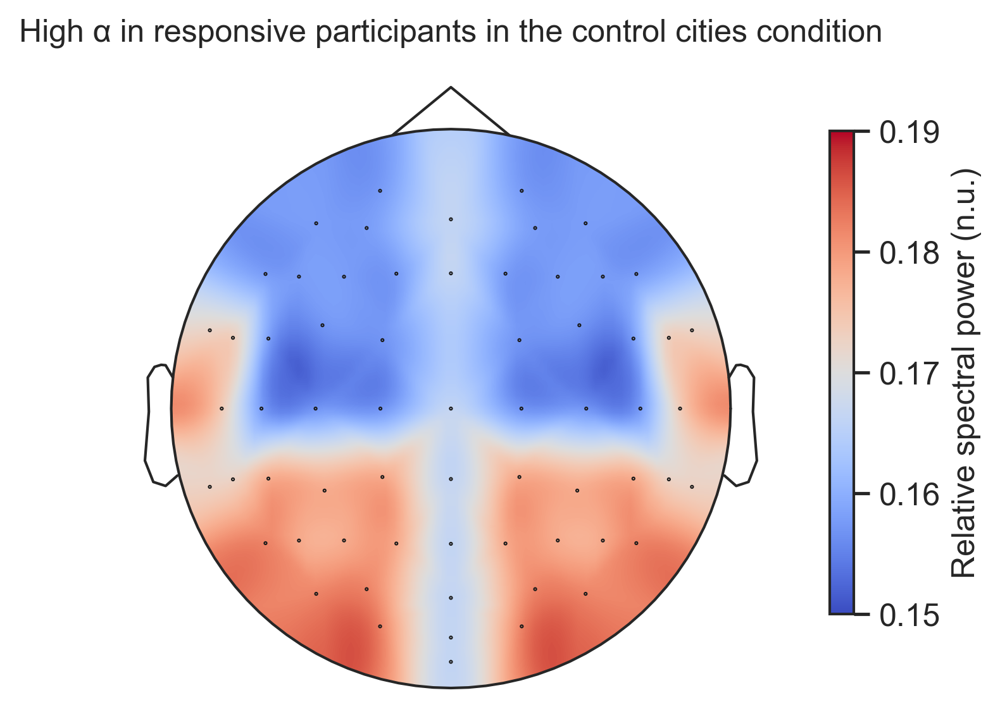

In [220]:
plot_topomap_condition(df_high_alpha_groups, regions, group=0, condition=1, bandname='high_alpha', vlim=(0.15,0.19), title='High α in responsive participants in the control cities condition')

# Supplemental Figure 8

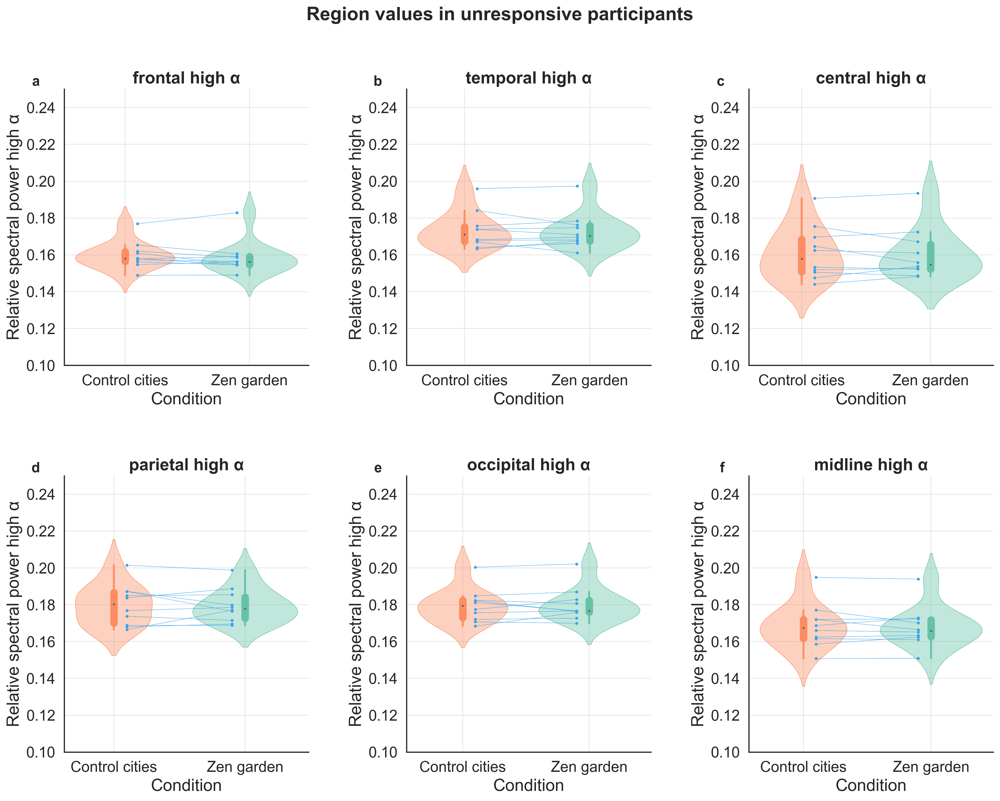

In [221]:
violin_plot_EEG_regions(high_alpha_regions, 1, 'unresponsive','high_alpha')

# Supplemental Figure 8 panels g,h,i

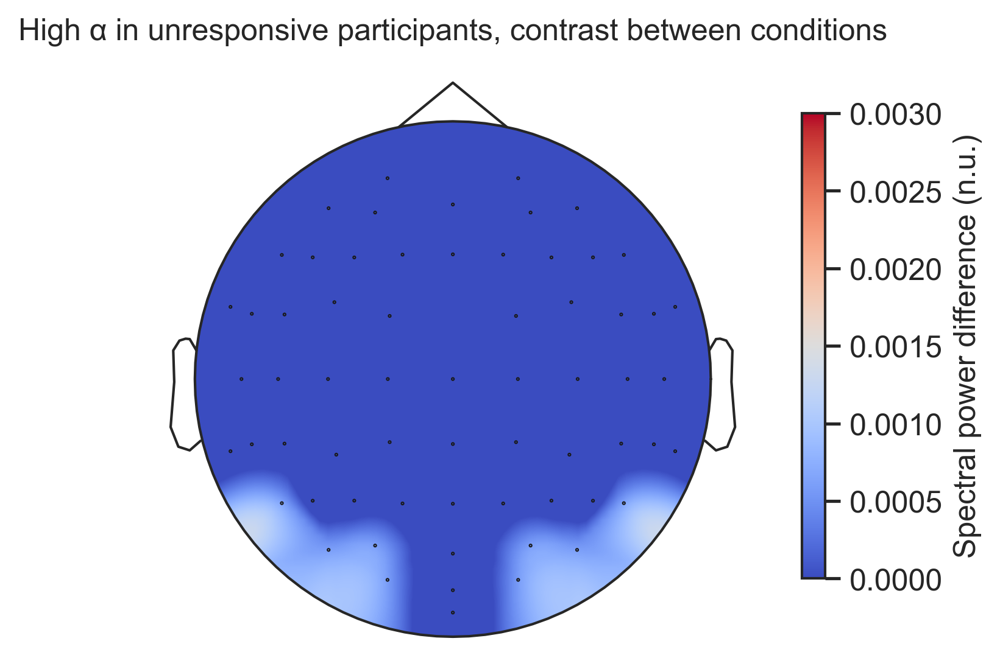

In [222]:
high_alpha_unresponsives = extract_contrast_values(df_high_alpha_groups, 1, 'high_alpha')
plot_contrast_topomap(regions, high_alpha_unresponsives, vlim = (0,0.003), title='High α in unresponsive participants, contrast between conditions')

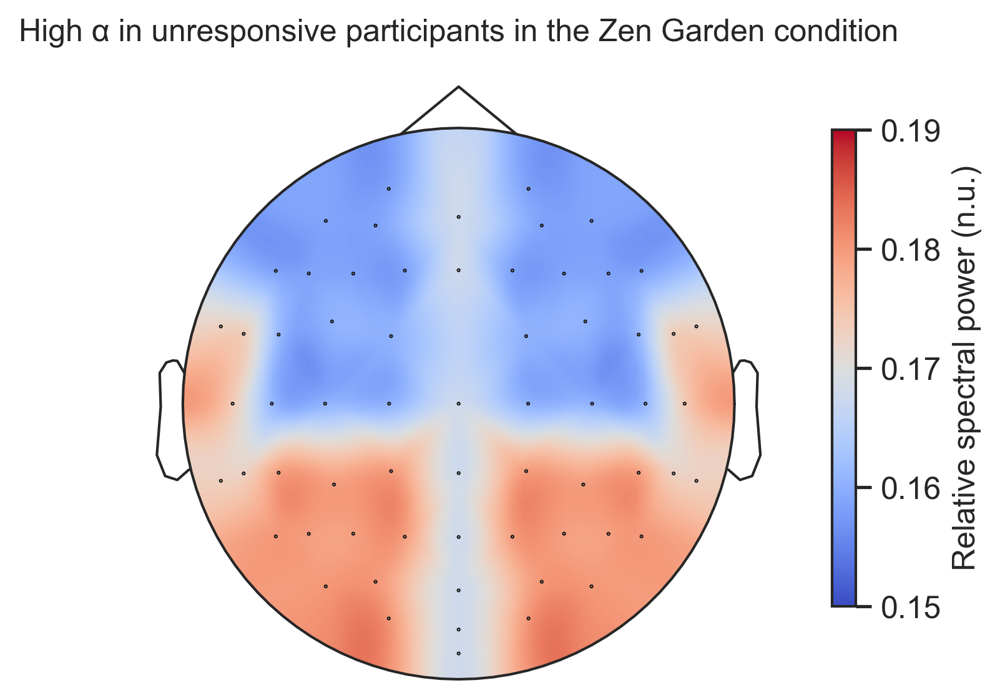

In [223]:
plot_topomap_condition(df_high_alpha_groups, regions, group=1, condition=0, bandname='high_alpha', vlim=(0.15,0.19), title='High α in unresponsive participants in the Zen Garden condition')

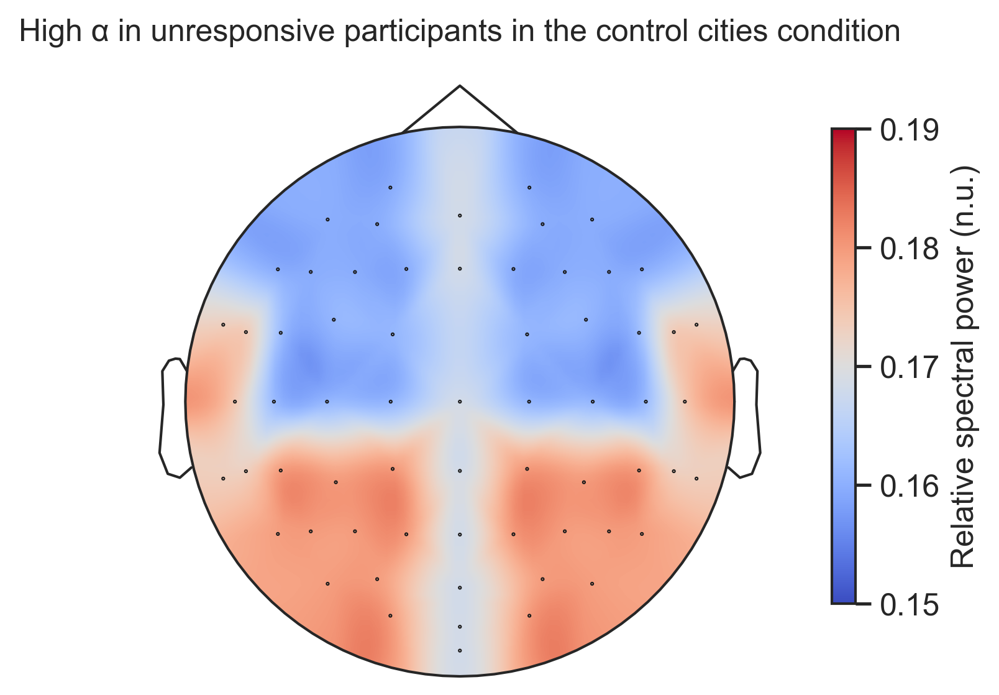

In [224]:
plot_topomap_condition(df_high_alpha_groups, regions, group=1, condition=1, bandname='high_alpha', vlim=(0.15,0.19), title='High α in unresponsive participants in the control cities condition')